# Examples working with ViSP data

Plus a few detours to compare with SDO/HMI, check in with VBI, show some (unphysical) continuum polarization the door.

2025-06-03<br>
Lucas Tarr<br>
ltarr@nso.edu<br>
NSO, Maui, HI<br>

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
import sys, os, glob
sys.path.append('/Users/ltarr/python_tools/')
from better_colorbar import colorbar
import dkist
%matplotlib widget

Find only the Visp ASDF files in subdirectories below the current directory.  For this example, I am working on previously downloaded data corresponding to the April 17, 2024 data of experiment PID_2_114.  This data was happy co-observation with the Hi-C and FOXI-4 sounding rocket experiments and coincided with a rather nice pair of GOES C flares and (likely) a filament eruption.  Quicklook images of the observations are found at https://nso.atlassian.net/wiki/spaces/PDOI/pages/3600024522/DKIST+Flare+Catalog, which also includes links to the relevant datasets at the DKIST Data Center.  The data can be downloaded from there.

More details about downloading data can be found here (
https://docs.dkist.nso.edu/projects/python-tools/en/latest/tutorial/5_downloading_data.html),  but I tend to just use the Globus web interface to download all observations for a given day to whatever computer I am going to do the analysis on.

Metadata for the observations are stored in the asdf files corresponding to the downloaded data.  I just search for those files:

In [2]:
asdffiles = glob.glob('**/*VISP*.asdf', recursive=True)

In [3]:
asdffiles

['ALZEL/VISP_L1_20240417T221310_ALZEL_metadata.asdf',
 'AJOPO/VISP_L1_20240417T221310_AJOPO_metadata.asdf',
 'AKRDQ/VISP_L1_20240417T221310_AKRDQ_metadata.asdf']

Create DKIST dataset objects from those ASDF files.  Note that this does NOT load any data, it only creates an object populated with metadata and all the functions for working with datasets

In [4]:
allds = dkist.load_dataset(asdffiles)

In [5]:
len(allds)

3

In [6]:
allds[0].data.shape

(4, 425, 937, 2549)

Structure of the data is revealed by inspecting the dataset object:

In [7]:
allds[0]

This VISP Dataset consists of 1700 frames.
Files are stored in ALZEL

This calibration has Dataset ID ALZEL.
The unique identifier for the input observe frames (Product ID) is (no ProductID).

This Dataset has 4 pixel and 5 world dimensions.

The data are represented by a <class 'dask.array.core.Array'> object:
dask.array<reshape, shape=(4, 425, 937, 2549), dtype=float32, chunksize=(1, 1, 937, 2549), chunktype=numpy.ndarray>

Array Dim  Axis Name                Data size  Bounds
        0  polarization state               4  None
        1  raster scan step number        425  None
        2  dispersion axis                937  None
        3  spatial along slit            2549  None

World Dim  Axis Name                  Physical Type                   Units
        4  stokes                     phys.polarization.stokes        unknown
        3  time                       time                            s
        2  helioprojective latitude   custom:pos.helioprojective.lat  arcsec
    

Plot some data from the first dataset.  This happens to be CaII 854.2nm data.  I've preselected the line core using information from later in this notebook.  I my first pass though, I just selected a random pixel in the wavelenth dimension.  I believe it was 200 instead of 596

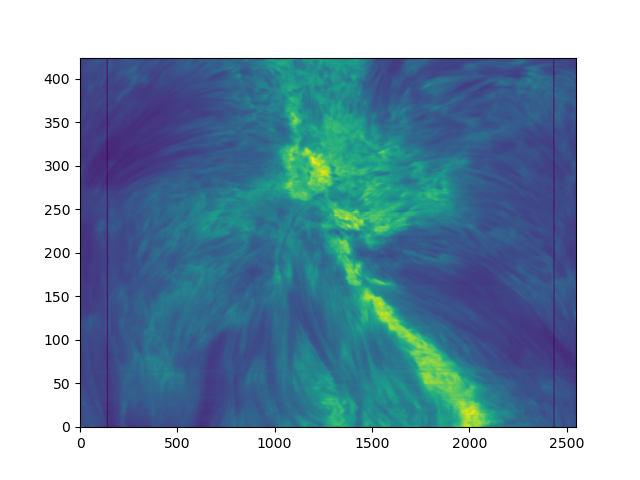

In [8]:
fig, ax = plt.subplots()
im = ax.imshow(allds[0][0,:,596,:].data,origin='lower')
ax.set_aspect('auto')
#im.set_data(allds[0][0,:,596,:].data)

Neat.I have no idea how that is oriented on the Sun. I'll work on that shortly.  

> You can also perform some quick views using the methods on the tutorial here (https://docs.dkist.nso.edu/projects/python-tools/en/latest/tutorial/6_visualization.html) but I also find it helpful to explore the data in a more low-level way, which is what I describe in this notebook

Before that, let's get the wavelength information for the three datasets.  This is stored as an axis in the world coordinates system.  Inspecting the data sets (by calling ``allds[i]`` to get info about dataset ``i``, as we did a few cells ago)  shows that the 3rd axis (index = 2) is the wavelength axis.

According to the documentation (https://docs.dkist.nso.edu/projects/python-tools/en/latest/tutorial/3_the_dataset.html#coordinates-arrays-pixels-oh-my) I think you can also get this information with the `ds.wcs.world_to_array_index()` function, although the way below worked for me.


In [10]:
wvlen0=allds[0][0,0,:,0].axis_world_coords()
wvlen1=allds[1][0,0,:,0].axis_world_coords()
wvlen2=allds[2][0,0,:,0].axis_world_coords()

Each of the above returns a 1 element tuple, so to understand what we're looking at, we need to select that element:

In [11]:
wvlen0[0].shape

(937,)

Here is the first and last wavelength elements:

In [12]:
wvlen0[0].value[[0,-1]]

array([853.26299765, 855.02095637])

At this level of calibrated data, the neither the spectral dispersion (i.e., dlambda/dpixel), nor the absolute wavelength range are necessarily right.  This requires correlation with a reference solar atmosphere, which I will not go into here.  

No matter, we press on. 

Now, plot an example spectra (from above, it is data axis number 2), for each of the datasets.  I'm going to make this a 2axis plot in x, where the lower x axis will show the wavelength in nm and the upper axis the pixel index.  The dual-axis will be useful for identifying the pixel location of the line core and wings.

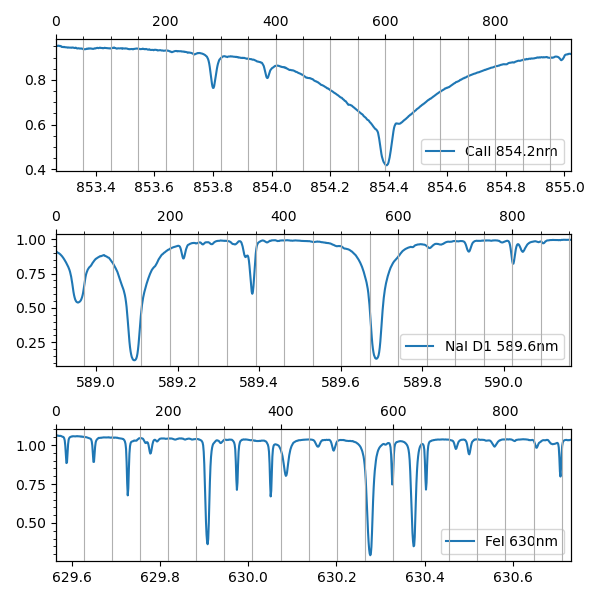

In [13]:
plt.close(2)
fig2,ax2 = plt.subplots(nrows=3, figsize=(6,6))
ax2[0].plot(wvlen0[0],allds[0][0,0,:,0].data,label = 'CaII 854.2nm')
ax2[1].plot(wvlen1[0],allds[1][0,0,:,0].data,label = 'NaI D1 589.6nm')
ax2[2].plot(wvlen2[0],allds[2][0,0,:,0].data,label = 'FeI 630nm')
# remove matplotlib's default padding of the x-axis range:
ax2[0].set_xlim(wvlen0[0].value[[0,-1]])
ax2[1].set_xlim(wvlen1[0].value[[0,-1]])
ax2[2].set_xlim(wvlen2[0].value[[0,-1]])

# add the second axis to each plot, and give us some fiducials on the pixel-based grid
aa = ax2[0].twiny()
aa.set_xlim([0,len(wvlen0[0])])
aa.minorticks_on()
aa.grid(True,which='both')

aa = ax2[1].twiny()
aa.set_xlim([0,len(wvlen1[0])])
aa.minorticks_on()
aa.grid(True,which='both')

aa = ax2[2].twiny()
aa.set_xlim([0,len(wvlen2[0])])
aa.minorticks_on()
aa.grid(True,which='both')

# I am legend
ax2[0].legend(loc='lower right')
ax2[1].legend(loc='lower right')
ax2[2].legend(loc='lower right',facecolor='white')
fig2.tight_layout()


You could also inspect the polarized data, say in stokes V, by call the 3rd polarization axis in each data area, e.g., `allds[0][3,0,:,0]`



Continuing, extract just the line core of each ViSP slit.  The pixel location of each line core was selected by eye using the above plot.  Slicing and subsampling of datasets is discussed in more detail here: https://docs.dkist.nso.edu/projects/python-tools/en/latest/tutorial/3_the_dataset.html

In [14]:
lc854 = 596 #pixel location of the CaII line core
lc589 = 560 #pixel location of the NaID1 line core
lc630 = 637 #pixel location of the 630.2 line core

linecore0 = allds[0][0,:,lc854,:]
linecore1 = allds[1][0,:,lc589,:]
linecore2 = allds[2][0,:,lc630,:]

Calculate the (spatial and temporal) world coordinates for each pixel in the dataset.  These are axis 1  (position of the slit on the sun over time) and 3 (each pixel position along the slit at a given time):

In [15]:
ii0,jj0 = linecore0.axis_world_coords()
ii1,jj1 = linecore1.axis_world_coords()
ii2,jj2 = linecore2.axis_world_coords()

Load the data into memory using ``dataset.data.compute()``.  This makes the following computations much faster (otherwise the data only lives on-disk, and subportions of it are loaded into memory every time they are needed, after which they are immediately discarded...which is good behavior in some circumstances, but rather annoying if your computer has more than enough memory.)

In [16]:
lcd0 = linecore0.data.compute()
lcd1 = linecore1.data.compute()
lcd2 = linecore2.data.compute()

Now plot the line core data over the full scanned field of view in each of the three arms.  Use sharex and sharey to make the total areas the same, and make sure the aspect ratio is equal.  This type of plot makes it easy to see the relative spatial extent of each visp slit.

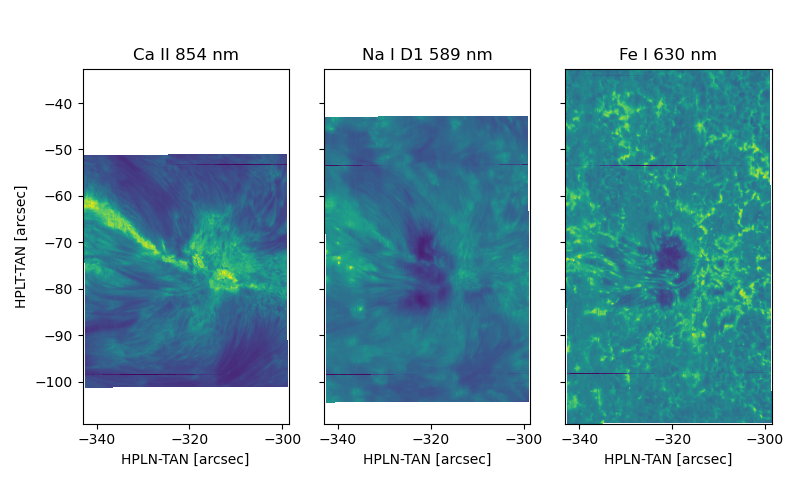

In [17]:
plt.close(3)
fig2, ax2 = plt.subplots(ncols=3, figsize=(8,5), sharex=True,sharey=True)
ax2[0].pcolormesh(ii0.Tx.value, ii0.Ty.value, lcd0)
ax2[1].pcolormesh(ii1.Tx.value, ii1.Ty.value, lcd1)
ax2[2].pcolormesh(ii2.Tx.value, ii2.Ty.value, lcd2)
ax2[0].set_title('Ca II 854 nm')
ax2[1].set_title('Na I D1 589 nm')
ax2[2].set_title('Fe I 630 nm')
ax2[0].set_ylabel('HPLT-TAN [arcsec]')
ax2[0].set_xlabel('HPLN-TAN [arcsec]')
ax2[1].set_xlabel('HPLN-TAN [arcsec]')
ax2[2].set_xlabel('HPLN-TAN [arcsec]')
ax2[0].set_aspect('equal')
ax2[1].set_aspect('equal')
ax2[2].set_aspect('equal')

fig2.tight_layout()

fig2.savefig('Line_core_images.png', dpi=300)
fig2.savefig('Line_core_images.pdf', dpi=300)

At this point, we're in a good position.  We see that we have a nice sunspot with a lot of interesting structure.  There's even a flare ribbon in the CaII 854.2 data(!), and, not shown here, I think a filament eruption(!!). 

We could modify the above plot to observe other spectral positions along the lines, look at the polarization signal, or inspect the data spectrally instead of spatially, by plotting the full spectra at a given raster step, instead of the intensity of a given wavelength at all spatial points.

But I know there is FOXSI-4 and Hi-C FLARE data that was taken near the same time for this data set, so I'm interested in getting this data coaligned with that data, and that means I need to know how good the reported coordinates are in this dataset.  For that, we should compare to SDO.

## SDO/HMI is ideal for coaligning heterogeneous data sets from multiple lines/instruments/facilities.  Where are we actually pointed?

To see how well we line up with the standard solar spatial reference (SDO!), let's grab the HMI data from jsoc from the middle of the ViSP raster.  The HMI catalog can be queried and data downloaded using  `drms` tool, amoung other means.  Here's an example: https://docs.sunpy.org/projects/drms/en/latest/generated/gallery/plot_polarfield.html.

Import the package and start the client:

In [18]:
import drms
client = drms.Client()

We calculated the time coordinates for the visp scan earlier.  Show starting time, end, and middle of the scan:

Construct a jsoc query using the mean value:

In [19]:
jj0.min(), jj0.max(), jj0.mean()

(<Time object: scale='utc' format='isot' value=2024-04-17T22:13:10.702>,
 <Time object: scale='utc' format='isot' value=2024-04-17T22:33:05.452>,
 <Time object: scale='utc' format='isot' value=2024-04-17T22:23:08.077>)

In [20]:
jj0.mean().value

'2024-04-17T22:23:08.077'

### Aside: Get the HMI Data

In [63]:
hmiseries = 'hmi.Ic_45s'
hmiseriesM = 'hmi.M_45s'

In [69]:
series_info = list(map(client.info,(hmiseries,hmiseriesM)))

In [74]:
print(series_info[0].note, series_info[1].note)
series_info[0].segments.index.values, series_info[1].segments.index.values

continuum intensities with a cadence of 45 seconds. magnetograms with a cadence of 45 seconds.


(array(['continuum'], dtype=object), array(['magnetogram'], dtype=object))

In [75]:
qstrI = hmiseries+'['+jj0.mean().value+']{continuum}'
resultI = client.query(qstr,pkeys=True)

qstrM = hmiseriesM+'['+jj0.mean().value+']{magnetogram}'
resultM = client.query(qstr,pkeys=True)

In [77]:
resultM, resultI

(                     T_REC  CAMERA
 0  2024.04.17_22:24:00_TAI       2,
                      T_REC  CAMERA
 0  2024.04.17_22:24:00_TAI       2)

In [80]:
export_requestI = client.export(qstrI, method='url', protocol='fits',email='ltarr@nso.edu')

In [78]:
export_requestM = client.export(qstrM, method='url', protocol='fits',email='ltarr@nso.edu')

In [81]:
export_requestM.request_url, export_requestI.request_url

2025-06-03 11:25:25 - drms - INFO: Export request pending. [id=JSOC_20250603_000905, status=2]
2025-06-03 11:25:25 - drms - INFO: Waiting for 0 seconds...


('http://jsoc.stanford.edu/SUM38/D1882181573/S00000',
 'http://jsoc.stanford.edu/SUM2/D1882014730/S00000')

In [82]:
os.mkdir('HMI_data')

Download the HMI data:

In [94]:
outdir = 'HMI_data/'
export_requestI.download(outdir)
export_requestM.download(outdir)

2025-06-03 11:44:51 - drms - INFO: Downloading file 1 of 1...
2025-06-03 11:44:51 - drms - INFO:     record: hmi.Ic_45s[2024.04.17_22:24:00_TAI][2]
2025-06-03 11:44:51 - drms - INFO:     filename: hmi.ic_45s.20240417_222400_TAI.2.continuum.fits
2025-06-03 11:44:53 - drms - INFO:     -> HMI_data/hmi.ic_45s.20240417_222400_TAI.2.continuum.fits.1
2025-06-03 11:44:53 - drms - INFO: Downloading file 1 of 1...
2025-06-03 11:44:53 - drms - INFO:     record: hmi.M_45s[2024.04.17_22:24:00_TAI][2]
2025-06-03 11:44:53 - drms - INFO:     filename: hmi.m_45s.20240417_222400_TAI.2.magnetogram.fits
2025-06-03 11:44:54 - drms - INFO:     -> HMI_data/hmi.m_45s.20240417_222400_TAI.2.magnetogram.fits.1


,record,url,download
0,hmi.M_45s[2024.04.17_22:24:00_TAI][2],http://jsoc.stanford.edu/SUM38/D1882181573/S00...,/Users/ltarr/data/DKIST/pid_2_114/20240417/HMI...


### Plot the HMI magnetogram and Intensity data

I downloaded the HMI data to my laptop in the collapsed cells up above this.  During a previous session.  We'll load that data in as a `sunpy.map` object.

In [21]:
import sunpy.map
from astropy.coordinates import SkyCoord

Here's the actual filenames for the HMI continuum data, and the magnetogram data is similar.  They're saved locally in the `outdir = 'HMI_data/'` directory

In [22]:
hmifilei = 'HMI_data/hmi.ic_45s.20240417_222400_TAI.2.continuum.fits'
hmifilem = 'HMI_data/hmi.m_45s.20240417_222400_TAI.2.magnetogram.fits'

Load the data as sunpy maps:

In [23]:
dati = sunpy.map.Map(hmifilei)
datm = sunpy.map.Map(hmifilem)

Get the x,y coordinates of the HMI data (this is a really memory inefficient method for what we are doing...)

In [24]:
hmii_xy = sunpy.map.all_coordinates_from_map(dati)
hmim_xy = sunpy.map.all_coordinates_from_map(datm)

Get the bounding box for the largest ViSP arm, which is arm 3 (as seen in our figure, above)

In [26]:
## with units
llunit = [ii2.Tx[0,0], ii2.Ty[0,0]]
urunit = [ii2.Tx[-1,-1],ii2.Ty[-1,-1]]

## values only
ll = [ii2.Tx[0,0].value, ii2.Ty[0,0].value]
ur = [ii2.Tx[-1,-1].value,ii2.Ty[-1,-1].value]

In [27]:
ii2.Ty.value[[0,424],0]

array([-109.03206177, -108.81796264])

In [28]:
ll, ur

([np.float64(-342.5929793315008), np.float64(-109.03206177204277)],
 [np.float64(-299.0137774918694), np.float64(-32.61844540138966)])

In [29]:
bboxx = [ll[0],ur[0],ur[0],ll[0],ll[0]]
bboxy = [ll[1],ll[1],ur[1],ur[1],ll[1]]
bboxx,bboxy

([np.float64(-342.5929793315008),
  np.float64(-299.0137774918694),
  np.float64(-299.0137774918694),
  np.float64(-342.5929793315008),
  np.float64(-342.5929793315008)],
 [np.float64(-109.03206177204277),
  np.float64(-109.03206177204277),
  np.float64(-32.61844540138966),
  np.float64(-32.61844540138966),
  np.float64(-109.03206177204277)])

Plot the HMI data, and overplot the visp FOV:

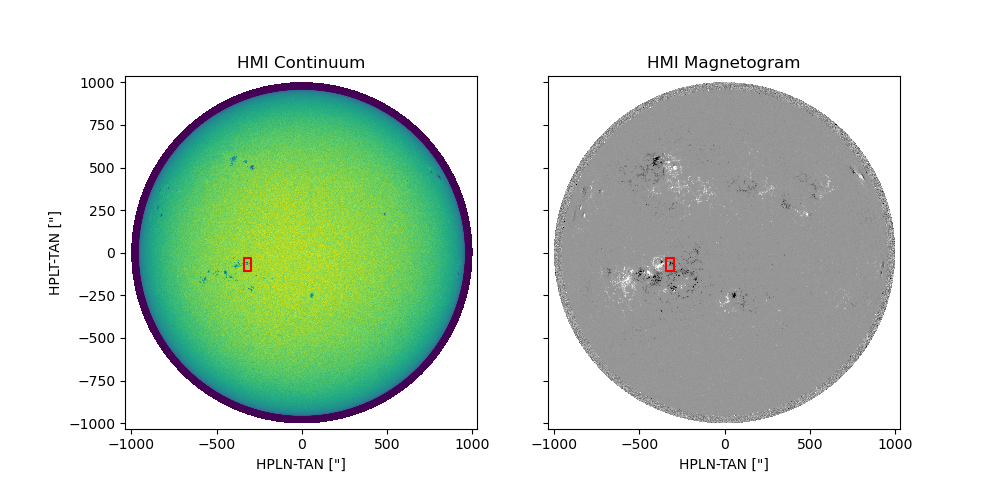

In [30]:
plt.close(4)
fig4, ax4 = plt.subplots(ncols=2, sharex=True, sharey=True,figsize=(10,5))
ax4[0].pcolormesh(hmii_xy.Tx.value,hmii_xy.Ty.value, dati.data, rasterized=True)
ax4[1].pcolormesh(hmii_xy.Tx.value,hmii_xy.Ty.value, datm.data, rasterized=True,cmap='Greys_r',vmin=-1e3,vmax=1e3)
ax4[0].set_aspect('equal')
ax4[1].set_aspect('equal')
ax4[0].set_xlabel('HPLN-TAN ["]')
ax4[1].set_xlabel('HPLN-TAN ["]')
ax4[0].set_ylabel('HPLT-TAN ["]')
ax4[0].set_title('HMI Continuum')
ax4[1].set_title('HMI Magnetogram')
ax4[0].plot(bboxx,bboxy, 'r')
ax4[1].plot(bboxx,bboxy, 'r')

Finally, let's make another plot that shows the HMI data next to our DKIST data.  We will recreate our Figure3, but add StokesV for the ViSP data and the HMI data.

To construct pseudo-magnetograms, difference stokes V from either side of the line core

I will also subsample the HMI data, to make the figure render faster (following example here: https://docs.sunpy.org/en/stable/generated/gallery/map/submaps_and_cropping.html#sphx-glr-generated-gallery-map-submaps-and-cropping-py).

In [31]:
stkv854 = allds[0][3,:,lc854-10,:].data-allds[0][3,:,lc854+10,:].data # blue - red
stkv589 = allds[1][3,:,lc589-10,:].data-allds[1][3,:,lc589+10,:].data
stkv630 = allds[2][3,:,lc630-10,:].data-allds[2][3,:,lc630+10,:].data

In [32]:
pad = 0*llunit[0].unit # do I want to pad the reduced FOV a bit?  nofornow
llwcs = SkyCoord(llunit[0]-pad,llunit[1],frame = dati.coordinate_frame)
urwcs = SkyCoord(urunit[0]+pad/2,urunit[1],frame = dati.coordinate_frame)

In [33]:
hmii_submap = dati.submap(llwcs, top_right=urwcs)
hmim_submap = datm.submap(llwcs, top_right=urwcs)
hmii_xysm = sunpy.map.all_coordinates_from_map(hmii_submap)

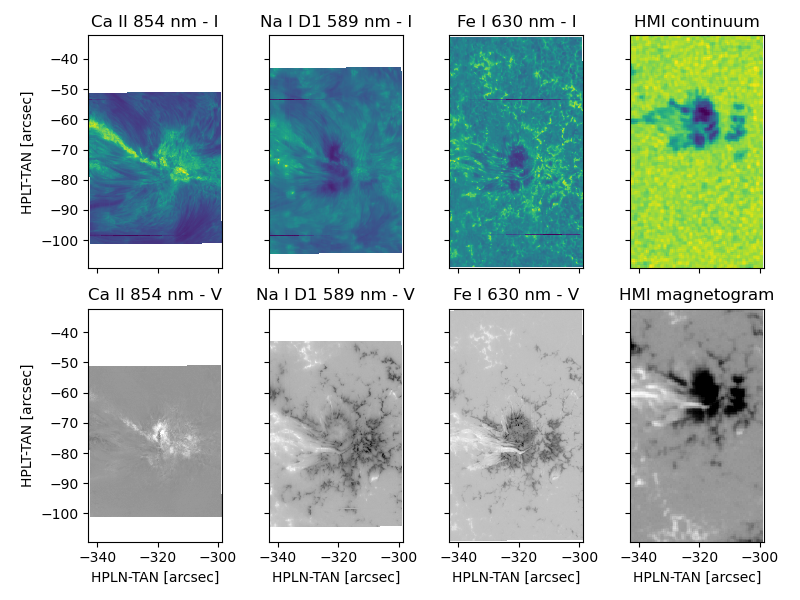

In [34]:
plt.close(5)
fig2, ax2 = plt.subplots(ncols=4, nrows=2, figsize=(8,6), sharex=True,sharey=True)

## all the ViSP stuff
ax2[0,0].pcolormesh(ii0.Tx.value, ii0.Ty.value, lcd0, rasterized=True)
ax2[0,1].pcolormesh(ii1.Tx.value, ii1.Ty.value, lcd1, rasterized=True)
ax2[0,2].pcolormesh(ii2.Tx.value, ii2.Ty.value, lcd2, rasterized=True)
ax2[1,0].pcolormesh(ii0.Tx.value, ii0.Ty.value, stkv854, rasterized=True,cmap='Grays_r',vmin=-0.3,vmax=0.3)
ax2[1,1].pcolormesh(ii1.Tx.value, ii1.Ty.value, stkv589, rasterized=True,cmap='Grays_r')
ax2[1,2].pcolormesh(ii2.Tx.value, ii2.Ty.value, stkv630, rasterized=True,cmap='Grays_r')
ax2[0,0].set_title('Ca II 854 nm - I')
ax2[0,1].set_title('Na I D1 589 nm - I')
ax2[0,2].set_title('Fe I 630 nm - I')
ax2[1,0].set_title('Ca II 854 nm - V')
ax2[1,1].set_title('Na I D1 589 nm - V')
ax2[1,2].set_title('Fe I 630 nm - V')
ax2[0,0].set_ylabel('HPLT-TAN [arcsec]')
ax2[1,0].set_ylabel('HPLT-TAN [arcsec]')
ax2[1,0].set_xlabel('HPLN-TAN [arcsec]')
ax2[1,1].set_xlabel('HPLN-TAN [arcsec]')
ax2[1,2].set_xlabel('HPLN-TAN [arcsec]')

## Add HMI
ax2[0,3].pcolormesh(hmii_xysm.Tx.value, hmii_xysm.Ty.value, hmii_submap.data, rasterized=True)
ax2[1,3].pcolormesh(hmii_xysm.Tx.value, hmii_xysm.Ty.value, hmim_submap.data, rasterized=True,cmap='Grays_r',vmin=-1000,vmax=1000)
ax2[0,3].set_title('HMI continuum')
ax2[1,3].set_title('HMI magnetogram')
ax2[1,3].set_xlabel('HPLN-TAN [arcsec]')

for aa in ax2.flatten():
    aa.set_aspect('equal')

fig2.tight_layout()

In [35]:
# Well...I believe I like that figure!

fig2.savefig('ViSP_HMI_comparison.png',dpi=300)
fig2.savefig('ViSP_HMI_comparison.pdf',dpi=300)

From this figure we can really see that coordinates given in the DKIST headers do not match HMI.  Depending on the analysis task, I would have to decide how much I care about that: completely ignore it?, do a rough, "by-eye" offset?, or apply a more finely tuned cross-correllation technique to really align the data to the best degree possible.  

That, however, is a separate task, and would probably be better to perform between VBI data and HMI continuum.  Speaking of which...

## Quick-look VBI FOV

We can do some of the same things for VBI.  I'll just show this briefly

In [36]:
vbifiles = glob.glob('**/*VBI*.asdf', recursive=True)

In [37]:
vbifiles

['ARNNW/VBI_L1_20240417T221304_ARNNW_metadata.asdf']

In [38]:
vbids = dkist.load_dataset(vbifiles)

In [40]:
vbids.data.shape

(456, 4096, 4096)

In [43]:
vbids

This VBI Dataset consists of 456 frames.
Files are stored in ARNNW

This calibration has Dataset ID ARNNW.
The unique identifier for the input observe frames (Product ID) is (no ProductID).

This Dataset has 3 pixel and 3 world dimensions.

The data are represented by a <class 'dask.array.core.Array'> object:
dask.array<reshape, shape=(456, 4096, 4096), dtype=float32, chunksize=(1, 4096, 4096), chunktype=numpy.ndarray>

Array Dim  Axis Name                  Data size  Bounds
        0  time                             456  None
        1  helioprojective latitude        4096  None
        2  helioprojective longitude       4096  None

World Dim  Axis Name                  Physical Type                   Units
        2  time                       time                            s
        1  helioprojective latitude   custom:pos.helioprojective.lat  arcsec
        0  helioprojective longitude  custom:pos.helioprojective.lon  arcsec

Correlation between pixel and world axes:

           

Just get coordinates for the central frame, 226:
>Be *_really_* careful pulling all the world coordinate information for VBI data!  You can easily completely overload your system's memory.  If I were to call `vbids.axis_world_coords()`, i.e., on the entire VBI dataset, it would attempt to use hundreds of GB of my system's RAM! 

In [44]:
ii =  vbids[226].axis_world_coords()

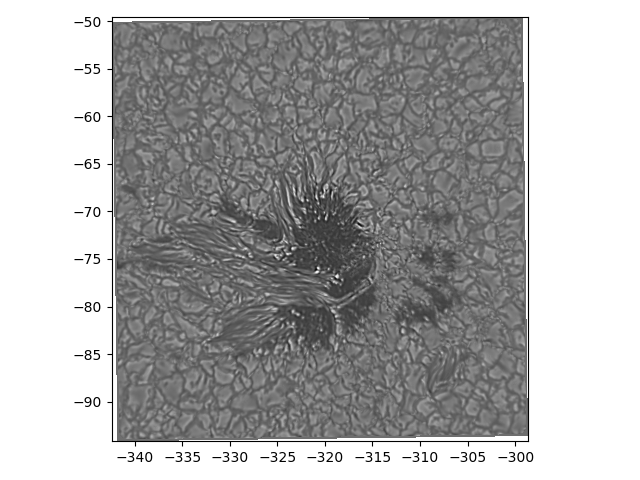

In [49]:
plt.close(6)
fig, ax = plt.subplots()
im = ax.pcolormesh(ii[0].Tx.value, ii[0].Ty.value, vbids[226].data,rasterized=True,cmap='Greys_r')
#im = ax.imshow(vbidata[0],origin='lower')
ax.set_aspect('equal')
fig.tight_layout()

Now display HMI continuum next to it for good measure.  Gotta show off a little...;-) 

This time, I will grab a little larger subfield of HMI, and also add that by-eye determined spatial offset to roughly align the two

In [53]:
pad = 10*llunit[0].unit # do I want to pad the reduced FOV a bit?  nofornow
llwcs = SkyCoord(llunit[0]-pad,llunit[1]-pad,frame = dati.coordinate_frame)
urwcs = SkyCoord(urunit[0]+pad,urunit[1]+pad,frame = dati.coordinate_frame)

hmii_submap2 = dati.submap(llwcs, top_right=urwcs)
hmii_xysm2 = sunpy.map.all_coordinates_from_map(hmii_submap2)

In [54]:
xoffset = 2
yoffset = 15

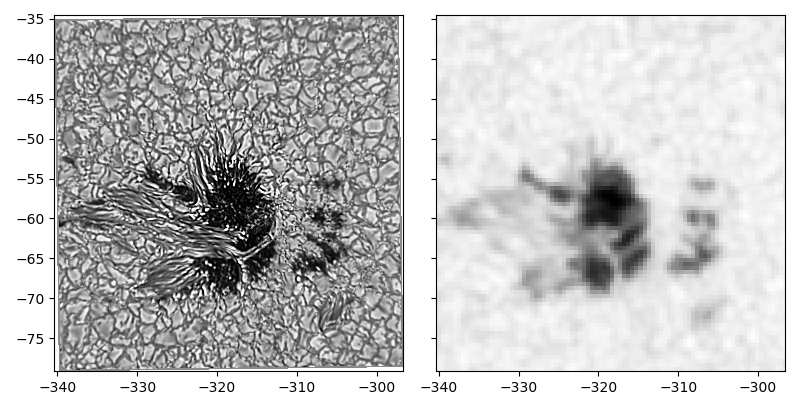

In [64]:
plt.close(7)
fig, ax = plt.subplots(ncols=2, sharex=True, sharey=True, figsize=(8,4))
im0 = ax[0].pcolormesh(ii[0].Tx.value+xoffset, ii[0].Ty.value+yoffset, vbids[226].data,rasterized=True,cmap='Greys_r',vmin=5e3,vmax = 90e3)
xlim = ax[0].get_xlim()
ylim = ax[0].get_ylim()

im1 = ax[1].pcolormesh(hmii_xysm2.Tx.value, hmii_xysm2.Ty.value, hmii_submap2.data, rasterized=True,cmap='Greys_r')
ax[1].set_xlim(xlim)
ax[1].set_ylim(ylim)

#im = ax.imshow(vbidata[0],origin='lower')
ax[0].set_aspect('equal')
ax[1].set_aspect('equal')
fig.tight_layout()

## Where to go from here?

At this point, I feel like I have a decent idea of what I'm looking at.  I can see the sunspot, surrounding plage and quiet sun regions, and there might be a flare ribbon in the CaII data, so lots of interesting targets for numerous science cases.  I could check out the polarization signal (array dimension 0), fit the line-core position at each spatio-temporal pixel location to get doppler velocities, 

- continuum intensity correction
    - Where do I start to learn about this?
    - Han's github
- nonlinearity of the wavelength
    - Han's github?
- crosstalk correction
    - Sarah's github: https://github.com/sajaeggli/adhoc_xtalk
- actual analysis!
    - line fitting, doppler velocities, stokes inversions, atmospheric modeling, ...

# destreak and ad-hoc cross talk correction - 589.6nm

The following section shows how to apply Sarah Jaeggli's ad-hoc crosstalk correction to the 589.6 data.

- Original code source (with examples for Hinode/SP): https://github.com/sajaeggli/adhoc_xtalk
- Method paper: https://ui.adsabs.harvard.edu/abs/2022ApJ...930..132J/abstract

This could be improved upon.  (And in fact, I've cut out some steps that are not necessary for this dataset).

In [5]:
import copy
from astropy.wcs import WCS
from matplotlib import colors
from scipy.optimize import minimize
from scipy.ndimage import shift

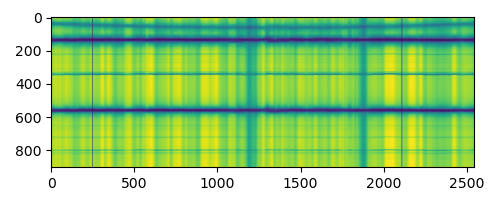

In [42]:
for i in range(10):
    plt.close(i)

fig, ax = plt.subplots(figsize=(5,2))
im = ax.imshow(allds[1][0,0,:,:].data)
fig.tight_layout()

zoom in:

In [43]:
ax.set_aspect('auto')
im.set_data(allds[0][0,205,:,:].data)
#im.set_clim(-0.01,0.01)
im.autoscale()

The following parameters select out spectral features by eye: the NaID1 line core, line wing, and a decent patch of continuum level.  The were determined iteratively using the next figure

In [8]:
recid = allds[1].files.basepath.name
print(recid)
bandpass_center_px, bandpass_width_px = (561, 320) # instead of using this, I just define a bandpass start and end in the next cell
continuum_center_px, continuum_width_px = (406, 5)
line_center_px, line_core_width_px, line_wing_width_px = (561, 10, 120)
slit_fiducial_center_px, slit_fiducial_width_px = ([249,2112], 4)
xshift_arcsec, yshift_arcsec = (-1, -14)
ithresh, pthresh = (0.65, 0.05) # umbral and polarization threshold

AJOPO


In [9]:
b0,b1 = (bandpass_center_px - bandpass_width_px, bandpass_center_px + bandpass_width_px)
#b0,b1 = 10,900
c0,c1 = (continuum_center_px-continuum_width_px-b0, continuum_center_px+continuum_width_px-b0)
lc0,lc1 = (line_center_px-line_core_width_px-b0, line_center_px+line_core_width_px-b0)
lw0,lw1 = (line_center_px-line_wing_width_px-b0, line_center_px+line_wing_width_px-b0)

I'm following Sarah Jaeggli's work, and she transposed the data in the following way.  The purpose here was to get it into an orientation that made some of the later computations a bit easier

In [10]:
# sarah transforms the data:
data = allds[1].data[:,:,b0:b1].transpose([1,3,2,0]).compute()
nZ,nY,nX,nS = data.shape
data.shape

(425, 2547, 640, 4)

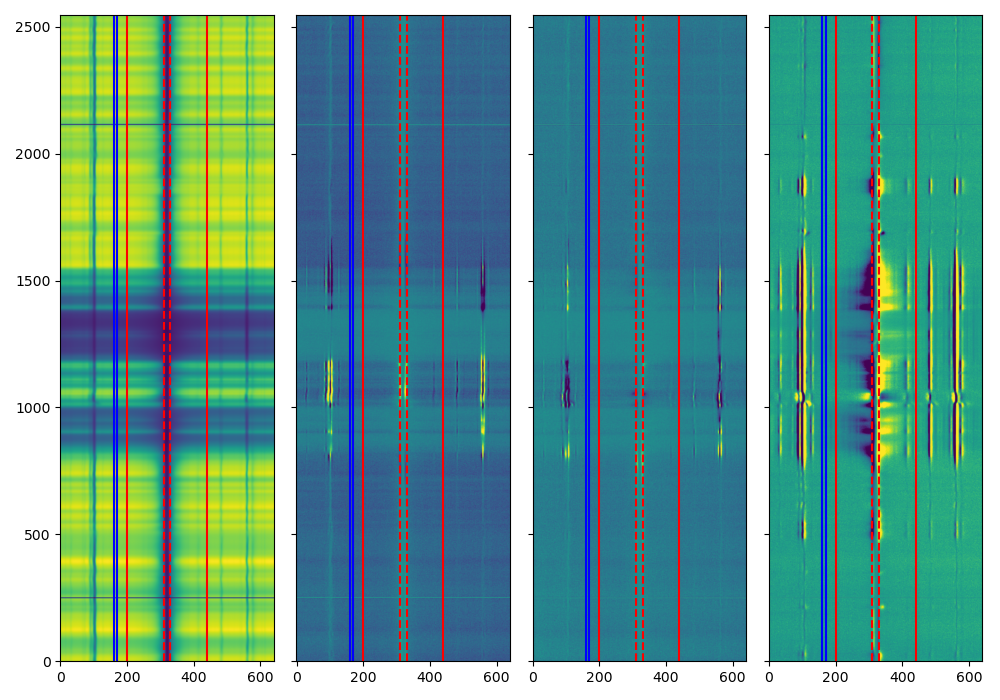

In [11]:
iZ = int(nZ/2)
plt.close(2)
fig,axs = plt.subplots(ncols=4, nrows=1,figsize=(10,7),sharex=True, sharey=True)
vmax = 0.01
axs[0].imshow(data[iZ,:,:,0], origin='lower')
axs[1].imshow(data[iZ,:,:,1], vmin=-vmax, vmax=vmax, origin='lower')
axs[2].imshow(data[iZ,:,:,2], vmin=-vmax, vmax=vmax, origin='lower')
axs[3].imshow(data[iZ,:,:,3], vmin=-vmax, vmax=vmax, origin='lower')

for ax in axs:
    ax.set_aspect('auto')
    
    #show the continuum region
    ax.plot([c0,c0],[0,nY-1], 'b-')
    ax.plot([c1,c1],[0,nY-1], 'b-')

    #show the line center
    #axs[iS].plot([l0,l0],[0,nY-1], 'r--')
    
    #show the line core
    ax.plot([lc0,lc0],[0,nY-1], 'r--')
    ax.plot([lc1,lc1],[0,nY-1], 'r--')
    
    #show the line wings
    ax.plot([lw0,lw0],[0,nY-1], 'r-')
    ax.plot([lw1,lw1],[0,nY-1], 'r-')

plt.tight_layout()

In the above map, especially in the Q and U data (middle plots) you can see the spatial variation in the *backgroud* polarized signal along the slit, causing the horizontal "streaks" in the wavelength direction.  Ostensibly, the continuum should be unpolarized at disk center, and have more and more linear polarization as you go closer to the limb.

This data set was taken within 500" of disk center, so it should be essentially unpolarized.  The following steps remove this residual polarized signal (likely due to ever-so-slight misalignment of the two polarized beams that ViSP combines to create the stokes maps)

In [12]:
# Generate Intensity and Polarization maps
Imap = np.mean(data[:,:,c0:c1,0], axis=2)
Pmap = np.max( np.sqrt( np.sum(data[:,:,lw0:lw1,1:nS]**2, axis=3) ) / data[:,:,lw0:lw1,0], axis=2)

In [13]:
#mask for slit fiducials (these are the horizontal markers on the ViSP data)
mask = (Imap > 0)

for cenY in slit_fiducial_center_px:
    y0 = cenY - slit_fiducial_width_px
    y1 = cenY + slit_fiducial_width_px
    mask[:,y0:y1] = 0

Zoom in on the fiducials, so we know where the are and how to mask them out:

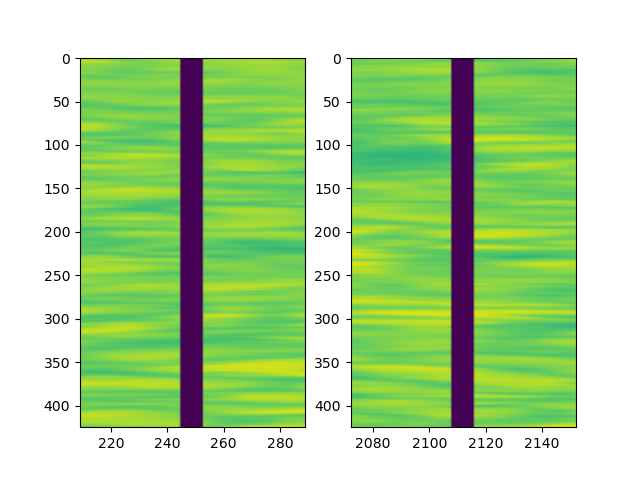

In [14]:
fig3, ax3 = plt.subplots(ncols= len(slit_fiducial_center_px))

for ap, cenY in enumerate(slit_fiducial_center_px):
    y0 = cenY - 10*slit_fiducial_width_px
    y1 = cenY + 10*slit_fiducial_width_px

    ax3[ap].imshow(mask*Imap, aspect='auto')
    ax3[ap].set_xlim(y0,y1)


Define some thresholds for different types of regions in the field of view

In [15]:
#make selection regions for data
mask_isumbra = (Imap < ithresh) * (Pmap > pthresh) * mask
isumbra = np.argwhere(mask_isumbra)
uzidx = isumbra[:,0]
uyidx = isumbra[:,1]

mask_ispolar = (Pmap > pthresh) * mask
ispolar = np.argwhere(mask_ispolar)
pzidx = ispolar[:,0]
pyidx = ispolar[:,1]

mask_notpolar = (Pmap < pthresh) * (Imap > ithresh) * mask
notpolar = np.argwhere(mask_notpolar)
nzidx = notpolar[:,0]
nyidx = notpolar[:,1]

Plot contour masks of the continuum intensity threshold and the integrated polarization in the spectral line, along with outlines of the threhold masks

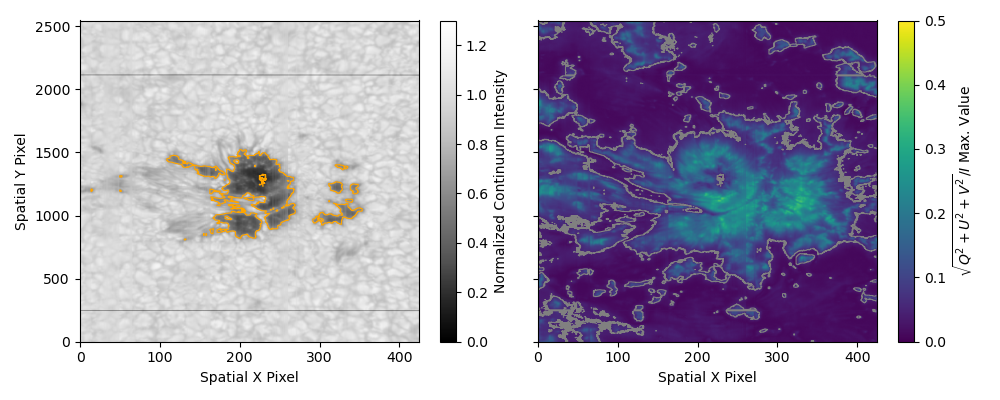

In [16]:
plt.close(4)
fig,axs = plt.subplots(ncols=2, nrows=1, sharex=True, sharey=True,figsize=(10,4))

iplot = axs[0].imshow(Imap.transpose(), vmin=0.0, vmax=1.3, origin='lower', cmap='Greys_r')
axs[0].contour(mask_isumbra.transpose(), colors='orange', linewidths=0.75)
axs[0].set_xlabel('Spatial X Pixel')
axs[0].set_ylabel('Spatial Y Pixel')
icb = fig.colorbar(iplot, ax=axs[0], label='Normalized Continuum Intensity')

pplot = axs[1].imshow(Pmap.transpose(), vmin=0, vmax=0.5, origin='lower')
axs[1].contour(mask_ispolar.transpose(), colors='gray', linewidths=0.75)
axs[1].set_xlabel('Spatial X Pixel')
pcb = fig.colorbar(pplot, ax=axs[1], label=r'$\sqrt{Q^2+U^2+V^2}/I$ Max. Value')

for ax in axs:
    ax.set_aspect('auto')

plt.tight_layout()
#plt.show()


Below this are some fitting functions.  Parts of the next cell are not really needed for this analysis, it is just a straight copy-paste from Sarah's example notebook from github.

In [17]:
# Functions for the diattenuation modeling

def polmodel1(D,theta,chi):
    dH = D*np.cos(chi)*np.sin(theta)
    d45 = D*np.sin(chi)*np.sin(theta)
    dR = D*np.cos(theta)
    A = np.sqrt(1. - dH**2 - d45**2 - dR**2)
    
    mat1=np.array([
        [ 1., dH, d45, dR], 
        [ dH,  A,  0., 0.], 
        [d45, 0.,   A, 0.],
        [ dR, 0.,  0.,  A]], dtype='double')
    
    mat2=np.array([
        [0.,     0.,     0.,     0.],
        [0.,  dH**2, d45*dH,  dH*dR],
        [0., d45*dH, d45**2, d45*dR],
        [0.,  dH*dR, d45*dR,  dR**2]], dtype='double')
    
    return( mat1 + (1-A)/D**2*mat2 )

def fitfunc1(param, stokesin):
    D = param[0]
    theta = param[1]
    chi = param[2]
    
    if D>=1:
        D=0.999999
        
    if D<=-1:
        D=-0.999999
        
    MM = polmodel1(D, theta, chi)
    iMM = np.linalg.inv(MM)

    out = minimize_for_model1(iMM,stokesin)

    return(out)

def minimize_for_model1(iMM,bs):
    # apply a mueller matrix (rotation) to a 2D stokes vector (slit_Y,wavelength_X,4)
    new_stokes = np.einsum('ij,abj->abi',iMM, np.squeeze(bs))
    
    # test different minimization criteria
    out = np.abs(np.sum(new_stokes[:,:,0]*new_stokes[:,:,3],axis=1)) + \
          np.abs(np.sum(new_stokes[:,:,0]*new_stokes[:,:,2],axis=1)) + \
          np.abs(np.sum(new_stokes[:,:,0]*new_stokes[:,:,1],axis=1))

    #sum over spatial positions
    out=np.sum(out)
    
    return(out)


# Functions for the rotation modeling
def polmodel2(theta, delta):
    St=np.sin(theta)
    Ct=np.cos(theta)
    Sd=np.sin(delta)
    Cd=np.cos(delta)
 
    MM1 = np.array([
        [1.,  0., 0., 0.],
        [0.,  Ct, St, 0.],
        [0., -St, Ct, 0.],
        [0.,  0., 0., 1.]
    ], dtype='double')
    
    MM2 = np.array([
        [1., 0.,  0., 0.],
        [0., 1.,  0., 0.],
        [0., 0.,  Cd, Sd],
        [0., 0., -Sd, Cd]
    ], dtype='double')
    
#    return(MM1 @ MM2)
    MM = np.einsum('ij,jk', MM1, MM2)
    return(MM)
    
def fitfunc2(fitangles, stokesin):
    theta = fitangles[0]
    delta = fitangles[1]
    
    MM = polmodel2(theta, delta)
    iMM = np.linalg.inv(MM)

    out = minimize_for_model2(iMM, stokesin)

    return(out)

def minimize_for_model2(iMM,bs):
    new_stokes = np.einsum('ij,abj->abi',iMM, np.squeeze(bs))
    
    out = np.sum(new_stokes[:,:,3],axis=1)**2 +\
          np.abs(np.sum(new_stokes[:,:,3]*new_stokes[:,:,2],axis=1)) +\
          np.abs(np.sum(new_stokes[:,:,3]*new_stokes[:,:,1],axis=1))
    
    #sum over spatial positions
    out=np.sum(out)
    
    return(out)

I'm not going to do a fit for the diattenuation term (output of pmodel1).  I'll just set the first mueller matrix to the unit matrix, and then perform the "destreaking".  This is an artifact that shows up mostly as a row-to-row variation in the continuum polarization probably due to slight misalignments of the two ViSP polarization beams that are combined to create the actual stokes vector.  

Note that the streaks not an optical effect! i.e., they do not come from the telescope optics.   The following step basically enforces the assumption that continuum is unpolarized.  For data sets closer to the limb, this is an increasingly *worse* assumption, and in those cases, some model for what the continuum polarization should be, at that location on the limb, should be applied instead.

In [84]:
from tqdm.notebook import tqdm # progress bar

In [44]:
'''# Only run this once.  then save result and load it.
data2 = np.copy(data) # this will be the corrected data
xgrid = np.mgrid[0:nX] + b0

nterms = 2 #number of polynomial terms for background fitting
destreak_params = np.zeros([nS,nZ,nY,nterms]) #output array for destreaking parameters

#Perform row-by-row correction
for iZ in tqdm(range(0,nZ)):
    for iY in range(0,nY):
        Ispec = data[iZ,iY,:,0]
        Pspec = np.sqrt(np.sum(data[iZ,iY,:,1:]**2, axis=1)) / Ispec
        Psigma = np.std(Pspec[c0:c1])
        Pmean = np.mean(Pspec[c0:c1])
        
        #exclude regions more the 3 sigma away from the mean continuum value
        spec_mask = (Pspec-Pmean) < Psigma*3.
        
        for iS in range(1,nS):
            Sspec = data[iZ,iY,:,iS] / Ispec
            
            #do a linear fit to residuals
            try:
                param = np.polyfit(xgrid[spec_mask], (Sspec)[spec_mask], nterms-1)
            except:
                spec_avg = np.median(Sspec[spec_mask])
                param = np.array([0., spec_avg])

            destreak_params[iS,iZ,iY,:] = param  
            data2[iZ,iY,:,iS] = data2[iZ,iY,:,iS] - data2[iZ,iY,:,0]*(param[0]*xgrid+param[1])

'''

'# Only run this once.  then save result and load it.\ndata2 = np.copy(data) # this will be the corrected data\nxgrid = np.mgrid[0:nX] + b0\n\nnterms = 2 #number of polynomial terms for background fitting\ndestreak_params = np.zeros([nS,nZ,nY,nterms]) #output array for destreaking parameters\n\n#Perform row-by-row correction\nfor iZ in tqdm(range(0,nZ)):\n    for iY in range(0,nY):\n        Ispec = data[iZ,iY,:,0]\n        Pspec = np.sqrt(np.sum(data[iZ,iY,:,1:]**2, axis=1)) / Ispec\n        Psigma = np.std(Pspec[c0:c1])\n        Pmean = np.mean(Pspec[c0:c1])\n\n        #exclude regions more the 3 sigma away from the mean continuum value\n        spec_mask = (Pspec-Pmean) < Psigma*3.\n\n        for iS in range(1,nS):\n            Sspec = data[iZ,iY,:,iS] / Ispec\n\n            #do a linear fit to residuals\n            try:\n                param = np.polyfit(xgrid[spec_mask], (Sspec)[spec_mask], nterms-1)\n            except:\n                spec_avg = np.median(Sspec[spec_mask])\n  

In [45]:
one_ds = allds[1] # select the NaID1 dataset, for E-Z access

In [19]:
outname = one_ds.files.basepath.name+'_destreaked_589.npz'

In [20]:
outname

'AJOPO_destreaked_589.npz'

Load the result of the previous computation:

In [21]:
destreaked_data = np.load(outname)
data2 = destreaked_data['destretched_589_data']

In [22]:
data2.shape

(425, 2547, 640, 4)

Make a before/after plot, highlighting a single timestep (`iZ`) from the middle of the scan, and a single spatial pixel along the list (`iY`, in the sunspot)

Destreaking removes the variations in I<->QUV signal as a function of position along the slit

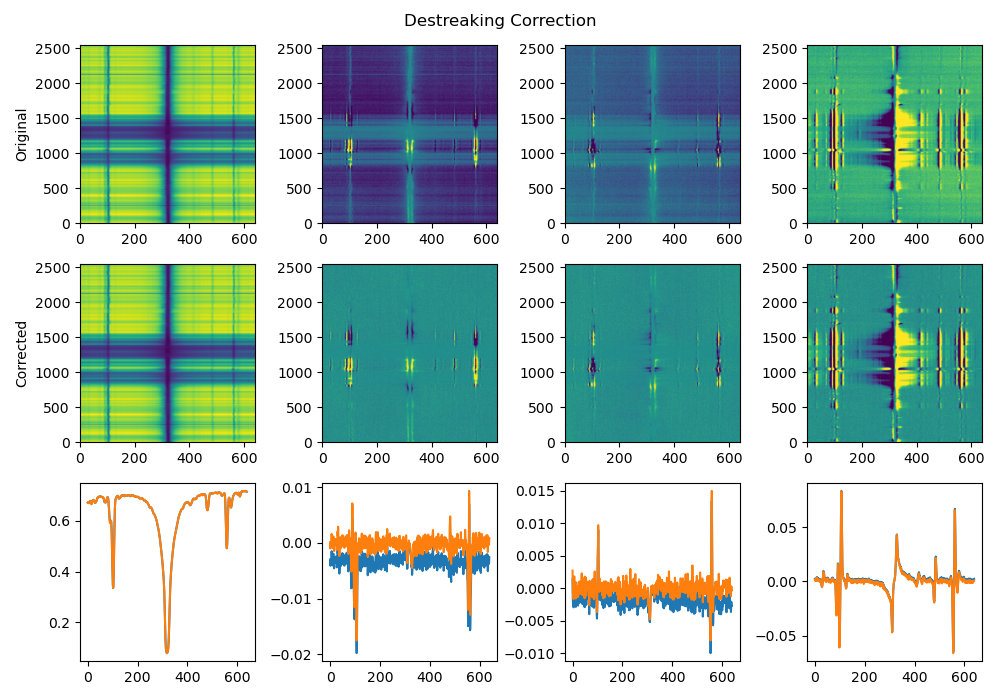

In [23]:
plt.close(5)
iZ = int(nZ/2)
iY = 1500

fig,axs = plt.subplots(ncols=4, nrows=3,figsize=(10,7))

fig.suptitle('Destreaking Correction')
axs[0,0].set_ylabel('Original')
axs[1,0].set_ylabel('Corrected')

vmax = 0.005

axs[0,0].imshow(data[iZ,:,:,0], origin='lower')
for iS in range(1,nS):
    axs[0,iS].imshow(data[iZ,:,:,iS], vmin=-vmax, vmax=vmax, origin='lower')

axs[1,0].imshow(data2[iZ,:,:,0], origin='lower')
for iS in range(1,nS):
    axs[1,iS].imshow(data2[iZ,:,:,iS], vmin=-vmax, vmax=vmax, origin='lower')

for iS in range(0,nS):
    axs[2,iS].plot(data[iZ,iY,:,iS])
    axs[2,iS].plot(data2[iZ,iY,:,iS])

for ax in axs.flatten():
    ax.set_aspect('auto')
    
plt.tight_layout()

Clearly, that is much nicer.  BUT, that was overly computationally expensive.  There's probably more thoughtful ways to do that step.

Now compute and remove the (Q,U)<->V crosstalk.  This is the computation of a single rotation of the stokes vectory, applied uniformly to every pixel and at every wavelength.

(again, I already ran this and save the result.  Don't run again)

In [46]:
'''# choose an initial guess of those cross talk parameters for the minimization algorithm
theta = 0.*np.pi/180.
delta = 0.*np.pi/180.
initial_guess = (theta,delta)

# Find the elliptical retardance parameters that minimize V*Q, V*U, and V*V
baddata = data2[pzidx, pyidx,:,:]
result = minimize(fitfunc2, initial_guess, args=baddata)

# Apply correction for QU<->V cross-talk
MM2 = polmodel2(result.x[0],result.x[1])
iMM2 = np.linalg.inv(MM2)
data3 =  np.einsum('ij,abcj->abci', iMM2, data2)
'''

"# choose an initial guess of those cross talk parameters for the minimization algorithm\ntheta = 0.*np.pi/180.\ndelta = 0.*np.pi/180.\ninitial_guess = (theta,delta)\n\n# Find the elliptical retardance parameters that minimize V*Q, V*U, and V*V\nbaddata = data2[pzidx, pyidx,:,:]\nresult = minimize(fitfunc2, initial_guess, args=baddata)\n\n# Apply correction for QU<->V cross-talk\nMM2 = polmodel2(result.x[0],result.x[1])\niMM2 = np.linalg.inv(MM2)\ndata3 =  np.einsum('ij,abcj->abci', iMM2, data2)\n"

In [24]:
outname = one_ds.files.basepath.name+'_QUV_crosstalk_removed_589.npz'
#desc='QU<-> crosstalk removed Na I 589nm data for the '+one_ds.files.basepath.name+' dataset.\n'+\
#'Note that the destreaked data has been downsampled in the wavelength direction \n'+\
#'from the original data, with range given by iwmin and iwmax.'
#np.savez(outname, description=desc, destretched_589_data = data3, iwmin=b0, iwmax=b1)

In [77]:
print(MM2)

[[ 1.          0.          0.          0.        ]
 [ 0.          0.93667389 -0.34979927 -0.0168077 ]
 [ 0.          0.35020284  0.93559448  0.0449549 ]
 [ 0.          0.         -0.04799419  0.99884761]]


Result of above calculation:

MM2: 

``[[ 1.          0.          0.          0.        ]``

``[ [ 0.          0.93667389 -0.34979927 -0.0168077 ]``

`` [ 0.          0.35020284  0.93559448  0.0449549 ]``

`` [ 0.          0.         -0.04799419  0.99884761]]``

Load the saved data:

In [25]:
d2 = np.load(outname)
data3 = d2['destretched_589_data']

In [26]:
data3.shape

(425, 2547, 640, 4)

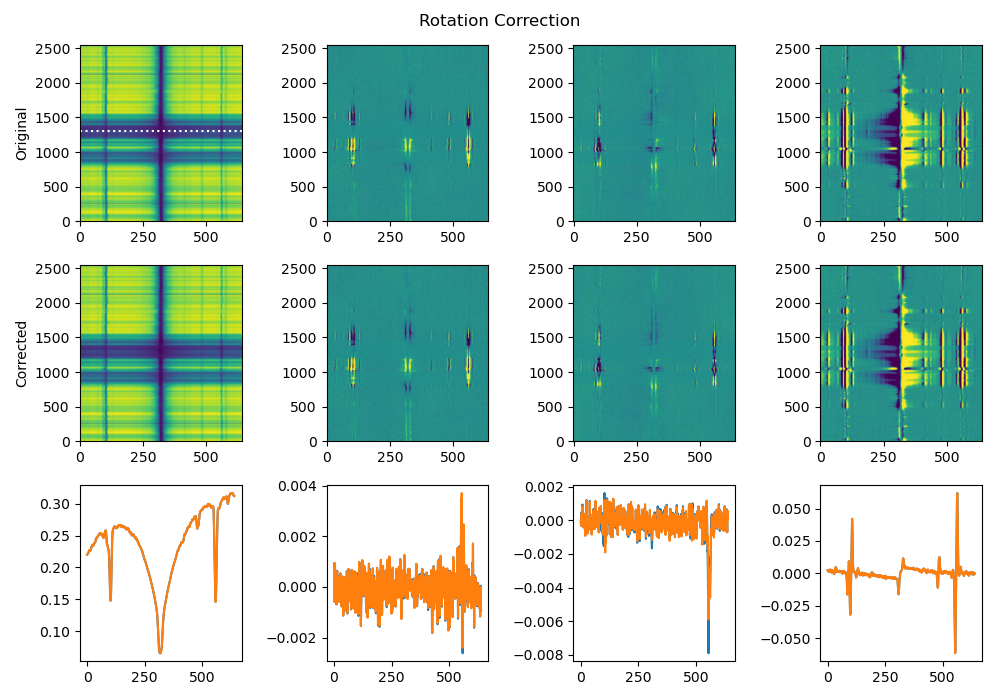

In [39]:
iZ = int(nZ/2) # this pixel selects the middle of the scan in time
iY = 1300 # this pixel selects a cut through the sunspot umbra

fig,axs = plt.subplots(ncols=4, nrows=3,figsize=(10,7))

fig.suptitle('Rotation Correction')
axs[0,0].set_ylabel('Original')
axs[1,0].set_ylabel('Corrected')

vmax = 0.005

axs[0,0].imshow(data2[iZ,:,:,0], origin='lower')
axs[0,0].axhline(iY, ls=':', color='w')
for iS in range(1,nS):
    axs[0,iS].imshow(data2[iZ,:,:,iS], vmin=-vmax, vmax=vmax, origin='lower')

axs[1,0].imshow(data3[iZ,:,:,0], origin='lower')
for iS in range(1,nS):
    axs[1,iS].imshow(data3[iZ,:,:,iS], vmin=-vmax, vmax=vmax, origin='lower')

for iS in range(0,nS):
    axs[2,iS].plot(data2[iZ,iY,:,iS])
    axs[2,iS].plot(data3[iZ,iY,:,iS])

for ax in axs.flatten():
    ax.set_aspect('auto')
    
plt.tight_layout()


So, not a great del of difference between the corrected and uncorrected. versions.  You'll have to decide for yourself if you think it was worth it.